## Cats vs. Dogs Class Activation Maps

Looking into Class Activation Model here for two classes: Cats and Dogs. 

###Imports


In [1]:
import tensorflow_datasets as tfds
import tensorflow as tf

import keras
from keras.models import Sequential,Model
from keras.layers import Dense,Conv2D,Flatten,MaxPooling2D,GlobalAveragePooling2D

import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import cv2

### Download and Prepare the Dataset
We will use the Cats vs Dogs dataset and we can load it via Tensorflow Datasets. The images are labeled 0 for cats and 1 for dogs.

In [3]:
train_data = tfds.load("cats_vs_dogs", split="train[:80%]", as_supervised=True)
validation_data = tfds.load("cats_vs_dogs", split="train[80%:90%]", as_supervised=True)
test_data = tfds.load("cats_vs_dogs", split="train[-10%:]", as_supervised=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/4.0.0.incomplete09RZIR/cats_vs_dogs-train.tfrecord*...:   0%|…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


Preprocess the image

In [4]:
def augment_images(image, label):

  # cast to float
  image = tf.cast(image, tf.float32)
  # normalize the pixel values
  image = (image / 255)
  # resize to 300x300
  image = tf.image.resize(image, (300, 300))

  return image, label

# use the utility function above to preprocess the images
augmented_training_data = train_data.map(augment_images)

# shuffle and create batches before training
train_batches = augmented_training_data.shuffle(1024).batch(32)

### Build the classifier



In [5]:
model = Sequential()
model.add(Conv2D(16, input_shape=(300, 300, 3), kernel_size=(3, 3), 
                 activation="relu", padding="same"))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, kernel_size=(3, 3), activation="relu", padding="same"))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, kernel_size=(3, 3), activation="relu", padding="same"))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, kernel_size=(3, 3), activation="relu", padding="same"))
model.add(GlobalAveragePooling2D())
model.add(Dense(1, activation="sigmoid"))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 300, 300, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 150, 150, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 75, 75, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 75, 75, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 37, 37, 64)       0

### Training the model

In [6]:
# Training will take around 30 minutes to complete using a GPU.

model.compile(loss="binary_crossentropy",
              metrics=["accuracy"],
              optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001))

model.fit(train_batches, epochs=25)

Epoch 1/25
582/582 [==============================] - 66s 93ms/step - loss: 0.6726 - accuracy: 0.5759
Epoch 2/25
582/582 [==============================] - 55s 91ms/step - loss: 0.6456 - accuracy: 0.6153
Epoch 3/25
582/582 [==============================] - 51s 82ms/step - loss: 0.6211 - accuracy: 0.6549
Epoch 4/25
582/582 [==============================] - 56s 91ms/step - loss: 0.6019 - accuracy: 0.6787
Epoch 5/25
582/582 [==============================] - 55s 92ms/step - loss: 0.5873 - accuracy: 0.6951
Epoch 6/25
582/582 [==============================] - 50s 83ms/step - loss: 0.5729 - accuracy: 0.7049
Epoch 7/25
582/582 [==============================] - 50s 82ms/step - loss: 0.5600 - accuracy: 0.7139
Epoch 8/25
582/582 [==============================] - 50s 82ms/step - loss: 0.5484 - accuracy: 0.7234
Epoch 9/25
582/582 [==============================] - 50s 82ms/step - loss: 0.5401 - accuracy: 0.7360
Epoch 10/25
582/582 [==============================] - 50s 82ms/step - loss: 0.527

### Building the CAM model

To generate the class activation map, we want to get the features detected in the last convolution layer and see which ones are most active when generating the output probabilities

In [9]:
model.layers[-3].name

'conv2d_3'

In [7]:
gap_weights = model.layers[-1].get_weights()[0]
gap_weights.shape

cam_model = Model(inputs=model.input, 
                  outputs=(model.layers[-3].output, 
                           model.layers[-1].output))
cam_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_input (InputLayer)   [(None, 300, 300, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 300, 300, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 150, 150, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 75, 75, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 75, 75, 64)        18496 

We can generate the CAM by getting the dot product of the class activation features and the class activation weights.

We will need the weights from the Global Average Pooling layer (GAP) to calculate the activations of each feature given a particular class.

Note that we'll get the weights from the dense layer that follows the global average pooling layer.
* The last conv2D layer has (h,w,depth) of (37 x 37 x 128), so there are 128 features.
* The global average pooling layer collapses the h,w,f (37 x 37 x 128) into a dense layer of 128 neurons (1 neuron per feature).
* The activations from the global average pooling layer get passed to the last dense layer.
* The last dense layer assigns weights to each of those 128 features (for each of the 2 classes),
* So the weights of the last dense layer (which immmediately follows the global average pooling layer) are referred to in this context as the "weights of the global average pooling layer".


In [14]:
def show_cam(image_value, features, results):
  """
  Displays the class activation map of an image

  Args:
    image_value (tensor) -- preprocessed input image with size 300 x 300
    features (array) -- features of the image, shape (1, 37, 37, 128)
    results (array) -- output of the sigmoid layer
  """

  # there is only one image in the batch so we index as `0`
  features_for_img = features[0]
  prediction = results[0]

  # there is only one unit in the output so we get the weights connected to it
  class_activation_weights = gap_weights[:, 0]

  # upsample to the image size
  class_activation_features = sp.ndimage.zoom(features_for_img, (300/37, 300/37, 1), order=2)

  cam_output = np.dot(class_activation_features, class_activation_weights)

  # visualize the results
  print(f"sigmoid output: {results}")
  print(f"prediction : {'dog' if round(results[0][0]) else 'cat'}")
  plt.figure(figsize=(8,8))
  plt.imshow(cam_output, cmap='jet', alpha=0.5)
  plt.imshow(tf.squeeze(image_value), alpha=0.5)
  plt.show()

### Testing the Model
Let's download a few images and see how the class activation maps look like.


In [17]:
!wget -O cat1.jpg https://cdn.pixabay.com/photo/2017/02/20/18/03/cat-2083492__340.jpg
!wget -O cat2.jpg https://img.etimg.com/thumb/msid-93429238,width-650,height-488,imgsize-34182,,resizemode-75/international-cat-day-2022-all-you-need-to-know-about-date-significance-history.jpg
!wget -O catanddog.jpg https://stpaulpet.com/wp-content/uploads/dog-facts-cat-facts.jpg
!wget -O dog1.jpg https://www.cdc.gov/healthypets/images/pets/cute-dog-headshot.jpg?_=42445
!wget -O dog2.jpg https://media.npr.org/assets/img/2022/11/23/russian-toy-2-002--059b8a825dac13f92234d65777e6b29b0914e92f-s1100-c50.jpg

--2023-02-23 14:49:19--  https://cdn.pixabay.com/photo/2017/02/20/18/03/cat-2083492__340.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.15.16, 104.18.14.16, 2606:4700::6812:f10, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.15.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 38588 (38K) [image/jpeg]
Saving to: ‘cat1.jpg’

cat1.jpg            100%[===================>]  37.68K  --.-KB/s    in 0s      

2023-02-23 14:49:19 (114 MB/s) - ‘cat1.jpg’ saved [38588/38588]

--2023-02-23 14:49:19--  https://img.etimg.com/thumb/msid-93429238,width-650,height-488,imgsize-34182,,resizemode-75/international-cat-day-2022-all-you-need-to-know-about-date-significance-history.jpg
Resolving img.etimg.com (img.etimg.com)... 117.121.250.56
Connecting to img.etimg.com (img.etimg.com)|117.121.250.56|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [image/jpeg]
Saving to: ‘cat2.jpg’

cat2.jpg                [ <=>         

1/1 [==============================] - 0s 312ms/step
sigmoid output: [[0.08650929]]
prediction : cat


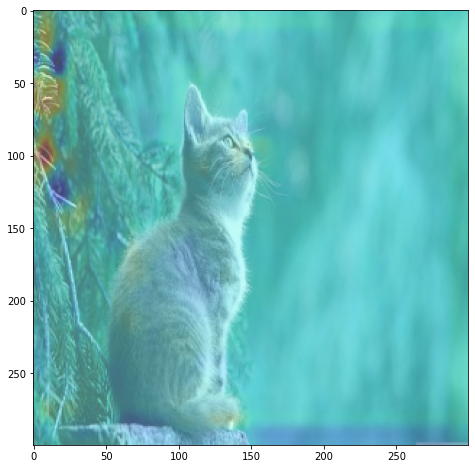

1/1 [==============================] - 0s 28ms/step
sigmoid output: [[0.995937]]
prediction : dog


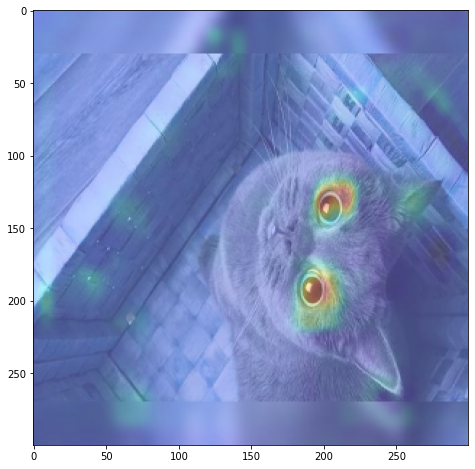

1/1 [==============================] - 0s 26ms/step
sigmoid output: [[0.4645918]]
prediction : cat


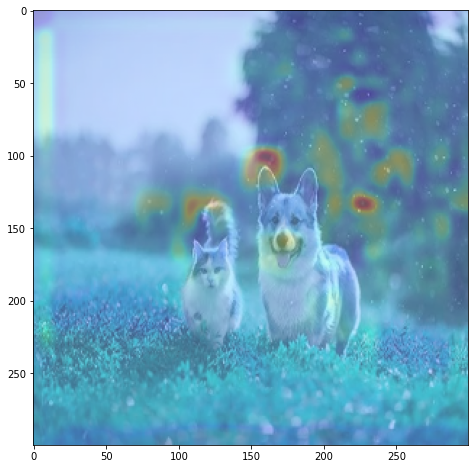

1/1 [==============================] - 0s 24ms/step
sigmoid output: [[0.35698348]]
prediction : cat


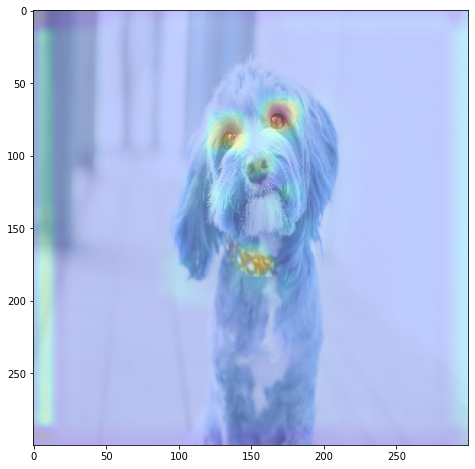

1/1 [==============================] - 0s 25ms/step
sigmoid output: [[0.54532444]]
prediction : dog


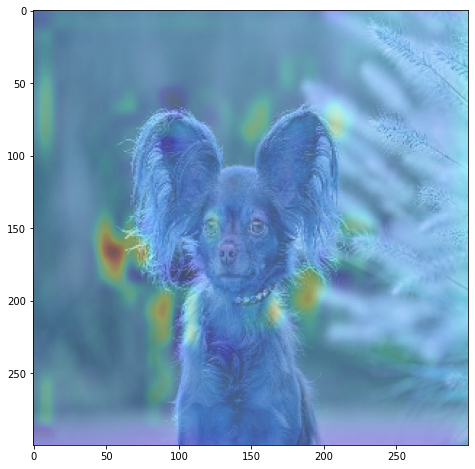

In [18]:
# utility function to preprocess an image and show the CAM
def convert_and_classify(image):

  # load the image
  img = cv2.imread(image)

  # preprocess the image before feeding it to the model
  img = cv2.resize(img, (300,300)) / 255.0

  # add a batch dimension because the model expects it
  tensor_image = np.expand_dims(img, axis=0)

  # get the features and prediction
  features,results = cam_model.predict(tensor_image)
  
  # generate the CAM
  show_cam(tensor_image, features, results)

convert_and_classify('cat1.jpg')
convert_and_classify('cat2.jpg')
convert_and_classify('catanddog.jpg')
convert_and_classify('dog1.jpg')
convert_and_classify('dog2.jpg')


ground truth: cat
1/1 [==============================] - 0s 19ms/step
sigmoid output: [[0.6861977]]
prediction : dog


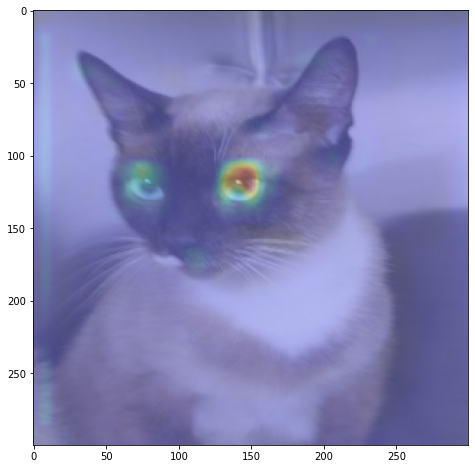

ground truth: dog
1/1 [==============================] - 0s 19ms/step
sigmoid output: [[0.32403594]]
prediction : cat


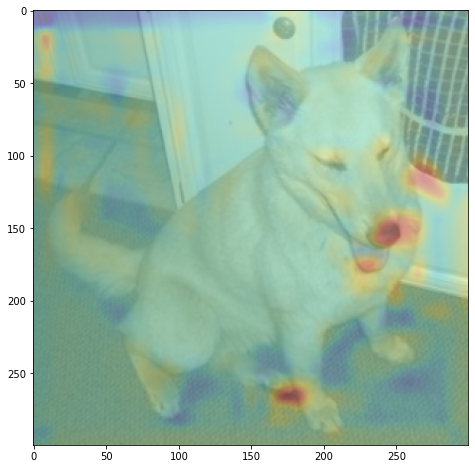

ground truth: dog
1/1 [==============================] - 0s 63ms/step
sigmoid output: [[0.41302902]]
prediction : cat


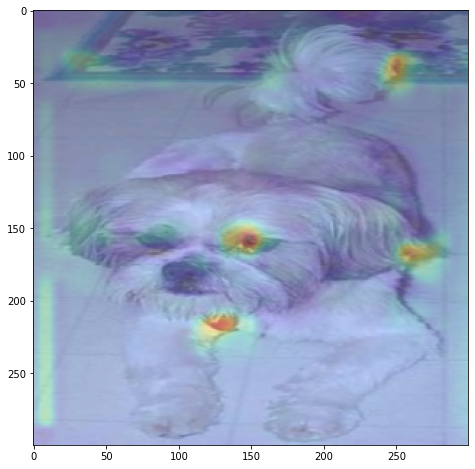

ground truth: cat
1/1 [==============================] - 0s 24ms/step
sigmoid output: [[0.05066521]]
prediction : cat


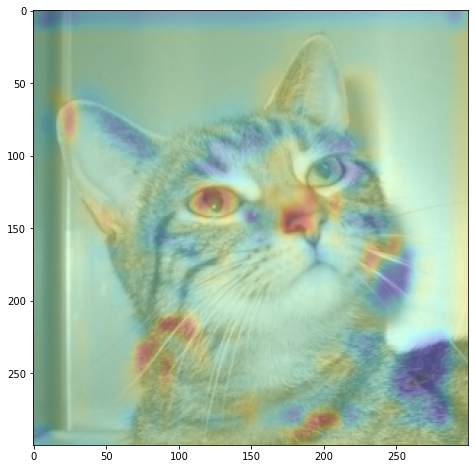

ground truth: cat
1/1 [==============================] - 0s 27ms/step
sigmoid output: [[0.53021103]]
prediction : dog


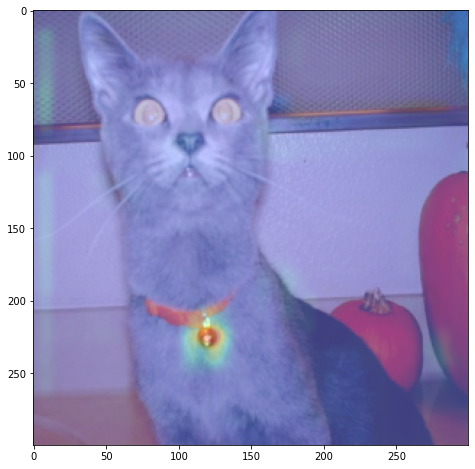

In [19]:
# preprocess the test images
augmented_test_data = test_data.map(augment_images)
test_batches = augmented_test_data.batch(1)


for img, lbl in test_batches.take(5):
  print(f"ground truth: {'dog' if lbl else 'cat'}")
  features,results = cam_model.predict(img)
  show_cam(img, features, results)

We may notice from the images above that the presence of eyes and nose play a big part in determining a dog, while whiskers and a colar mostly point to a cat. Some can be misclassified based on the presence or absence of these features. This tells us that the model is not yet performing optimally and we need to tweak our process (e.g. add more data, train longer, use a different model, etc).

##GradCAM

Generating gradient-weighted class activation maps (GradCAMs) for model predictions.

This is similar to the CAMs except:
* GradCAMs uses gradients instead of the global average pooling weights to weight the activations.

###Imports


In [1]:
%tensorflow_version 2.x

import warnings 
warnings.filterwarnings("ignore")

import os
import glob
import cv2
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from skimage.io import imread, imsave
from skimage.transform import resize 
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras.applications import vgg16
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import SGD, Adam, RMSprop

import tensorflow as tf
import tensorflow.keras.backend as K
import tensorflow_datasets as tfds
import tensorflow_hub as hub

import imgaug as ia
from imgaug import augmenters as iaa

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [2]:
splits = ["train[:80%]", "train[80%:90%]", "train[90%:]"]

# load the dataset given the splits defined above
splits, info = tfds.load("cats_vs_dogs", with_info=True, as_supervised=True, split=splits)

(train_examples, validation_examples, test_examples) = splits

num_examples = info.splits["train"].num_examples
num_classes = info.features["label"].num_classes

In [3]:
BATCH_SIZE = 32
IMAGE_SIZE = (224, 224)

# resizes the image and normalizes the pixel values
def format_image(image, label):
  image = tf.image.resize(image, IMAGE_SIZE) / 255.0
  return image, label

# prepare batches
train_batches = train_examples.shuffle(num_examples // 4).map(format_image).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)
validation_batches = validation_examples.map(format_image).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)
test_batches = test_examples.map(format_image).batch(1)

### Improving the Model

We will use a pre-trained VGG16 network as our base model for the classifier. This will be followed by a global average pooling (GAP) and a 2-neuron Dense layer with softmax activation for the output. The earlier VGG blocks will be frozen and we will just fine-tune the final layers during training. 



In [4]:
def build_model():
  # load the base VGG16 model
  base_model = vgg16.VGG16(input_shape=IMAGE_SIZE + (3,),
                           weights="imagenet",
                           include_top=False)
  
  # freeze the earlier layers
  for layer in base_model.layers[:-4]:
    layer.trainable = False

  # add a GAP layer
  output = layers.GlobalAveragePooling2D()(base_model.output)

  # output has two neurons for the 2 classes (cats and dogs)
  output = layers.Dense(2, activation="softmax")(output)

  # set the inputs and outputs of the model
  model = Model(base_model.input, output)

  # choose the optimizer
  optimizer = tf.keras.optimizers.RMSprop(0.001)  

  # configure the model for training
  model.compile(loss="sparse_categorical_crossentropy",
                optimizer=optimizer,
                metrics=["accuracy"])
  
  # display the summary
  model.summary()

  return model

In [5]:
model = build_model()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [6]:
EPOCHS = 3
model.fit(train_batches,
          epochs=EPOCHS,
          validation_data=validation_batches)

Epoch 1/3
582/582 [==============================] - 116s 171ms/step - loss: 0.8002 - accuracy: 0.4993 - val_loss: 0.6937 - val_accuracy: 0.4815
Epoch 2/3
582/582 [==============================] - 101s 165ms/step - loss: 0.6932 - accuracy: 0.5030 - val_loss: 0.6936 - val_accuracy: 0.4815
Epoch 3/3
582/582 [==============================] - 100s 163ms/step - loss: 0.6932 - accuracy: 0.5024 - val_loss: 0.6933 - val_accuracy: 0.4815


### Model Interpretability
Let's now go through the steps to generate the class activation maps. We will start by specifying the layers you want to visualize.



In [7]:
# select all the layers for which you want visualize the outputs and store it in a list
outputs = [layer.output for layer in model.layers[1:18]]

# Define a new model that generates the above output
vis_model = Model(model.input, outputs)

# store the layer names we are interested in
layer_names = []
for layer in outputs:
  layer_names.append(layer.name.split("/")[0])

print("Layers that will be used for visualization: ")
print(layer_names)

Layers that will be used for visualization: 
['block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1', 'block2_conv2', 'block2_pool', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool', 'block5_conv1', 'block5_conv2', 'block5_conv3']


### Class activation maps (GradCAM)

In [8]:
def get_CAM(processed_image, actual_label, layer_name='block5_conv3'):
  model_grad = Model([model.inputs],
                     [model.get_layer(layer_name).output, model.output])
  
  with tf.GradientTape() as tape:
    conv_output_values, predictions = model_grad(processed_image)

    # watch the conv_output_values
    tape.watch(conv_output_values)

    ## Use binary cross entropy loss
    ## actual_label is 0 if cat, 1 if dog
    # get prediction probability of dog
    # If model does well, 
    # pred_prob should be close to 0 if cat, close to 1 if dog
    pred_prob = predictions[:,1]

    # make sure actual_label is a float, like the rest of the loss calculation
    actual_label = tf.cast(actual_label, dtype=tf.float32)

    # add a tiny value to avoid log of 0
    smoothing = 0.00001

    # Calculate loss as binary cross entropy
    loss = -1 * (actual_label * tf.math.log(pred_prob + smoothing) + (1 - actual_label) * tf.math.log(1 - pred_prob + smoothing))
    print(f"binary loss: {loss}")

  # get the gradient of the loss with respect to the outputs of the last conv layer
  grads_values = tape.gradient(loss, conv_output_values)
  grads_values = K.mean(grads_values, axis=(0, 1, 2))

  conv_output_values = np.squeeze(conv_output_values.numpy())
  grads_values = grads_values.numpy()

  # weight the convolution outputs with the computed gradients
  for i in range(512):
    conv_output_values[:,:,i] *= grads_values[i]
  heatmap = np.mean(conv_output_values, axis=-1)

  heatmap = np.maximum(heatmap, 0)
  heatmap /= heatmap.max()

  del model_grad, conv_output_values, grads_values, loss

  return heatmap

In [9]:
def show_sample(idx=None):
  # if image index is specified, get that image
  if idx:
    for img, label in test_batches.take(idx):
      sample_image = img[0]
      sample_label = label[0]
  else:
    for img, label in test_batches.shuffle(1000).take(1):
      sample_image = img[0]
      sample_label = label[0]
  
  sample_image_processed = np.expand_dims(sample_image, axis=0)

  activations = vis_model.predict(sample_image_processed)

  pred_label = np.argmax(model.predict(sample_image_processed), axis=-1)[0]

  sample_activation = activations[0][0,:,:,16]

  sample_activation -= sample_activation.mean()
  sample_activation /= sample_activation.std()

  sample_activation *= 255
  sample_activation = np.clip(sample_activation, 0, 255).astype(np.uint8)

  heatmap = get_CAM(sample_image_processed, sample_label)
  heatmap = cv2.resize(heatmap, (sample_image.shape[0], sample_image.shape[1]))
  heatmap = heatmap * 255
  heatmap = np.clip(heatmap, 0, 255).astype(np.uint8)
  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_HOT)
  converted_image = sample_image.numpy()
  super_imposed_image = cv2.addWeighted(converted_image, 0.8, heatmap.astype("float32"), 2e-3, 0.0)

  f, ax = plt.subplots(2, 2, figsize=(15, 8))

  ax[0, 0].imshow(sample_image)
  ax[0, 0].set_title(f"True label: {sample_label} \n Predicted label: {pred_label}")
  ax[0, 0].axis("off")

  ax[0,1].imshow(sample_activation)
  ax[0,1].set_title("Random feature map")
  ax[0,1].axis('off')
  
  ax[1,0].imshow(heatmap)
  ax[1,0].set_title("Class Activation Map")
  ax[1,0].axis('off')
  
  ax[1,1].imshow(super_imposed_image)
  ax[1,1].set_title("Activation map superimposed")
  ax[1,1].axis('off')

  plt.tight_layout()
  plt.show()

  return activations

#### Visualize the results


1/1 [==============================] - 0s 249ms/step
binary loss: [0.688146]


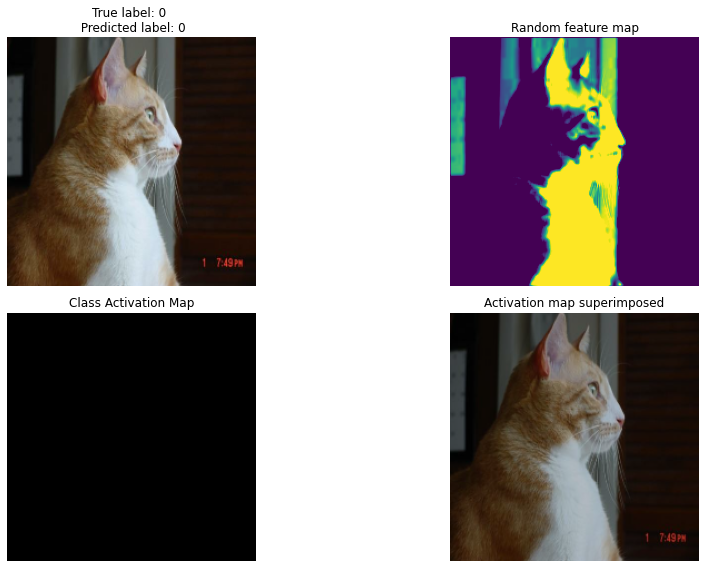

In [10]:
# Choose an image index to show, or leave it as None to get a random image
activations = show_sample(idx=None)


In [11]:
def visualize_intermediate_activations(layer_names, activations):
    assert len(layer_names)==len(activations), "Make sure layers and activation values match"
    images_per_row=16
    
    for layer_name, layer_activation in zip(layer_names, activations):
        nb_features = layer_activation.shape[-1]
        size= layer_activation.shape[1]

        nb_cols = nb_features // images_per_row
        grid = np.zeros((size*nb_cols, size*images_per_row))

        for col in range(nb_cols):
            for row in range(images_per_row):
                feature_map = layer_activation[0,:,:,col*images_per_row + row]
                feature_map -= feature_map.mean()
                feature_map /= feature_map.std()
                feature_map *=255
                feature_map = np.clip(feature_map, 0, 255).astype(np.uint8)

                grid[col*size:(col+1)*size, row*size:(row+1)*size] = feature_map

        scale = 1./size
        plt.figure(figsize=(scale*grid.shape[1], scale*grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.axis('off')
        plt.imshow(grid, aspect='auto', cmap='viridis')
    plt.show()


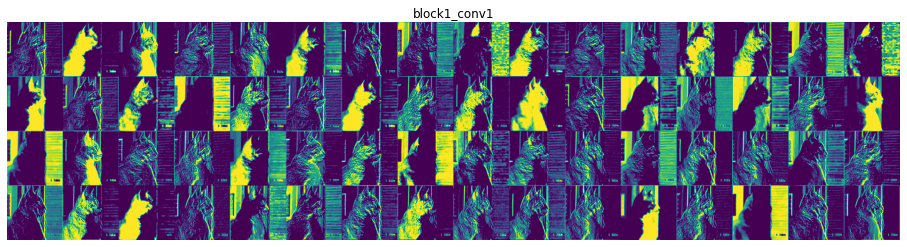

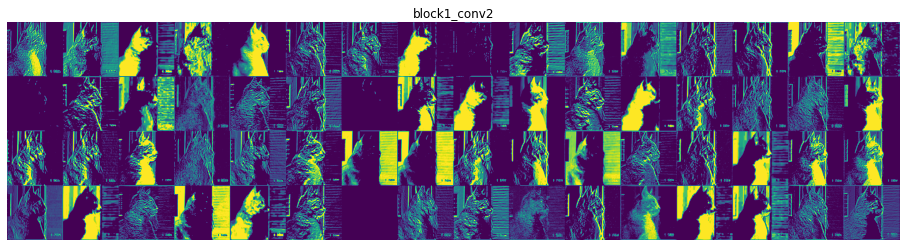

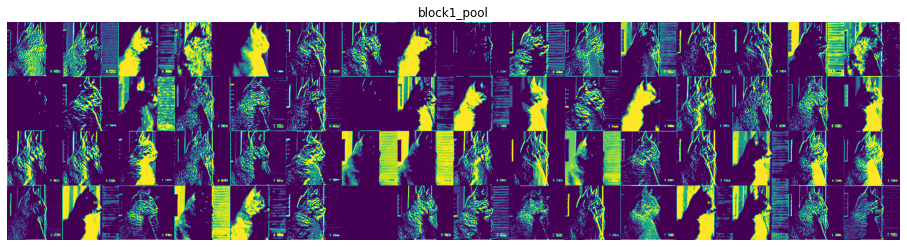

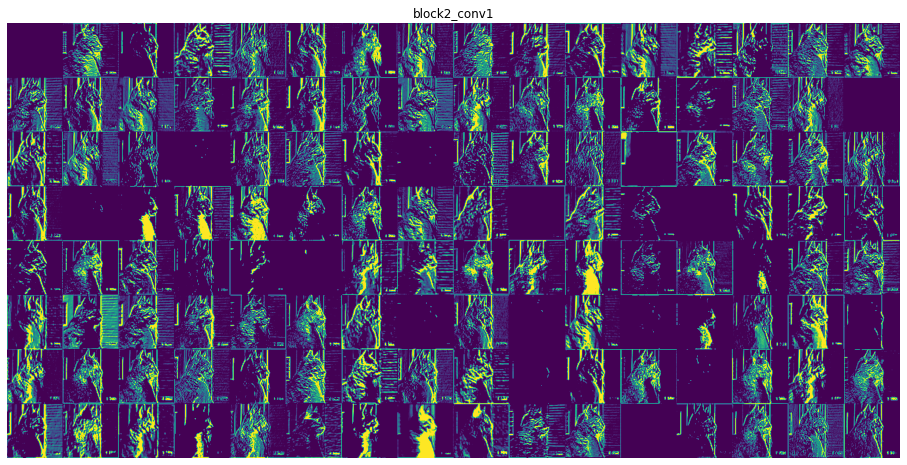

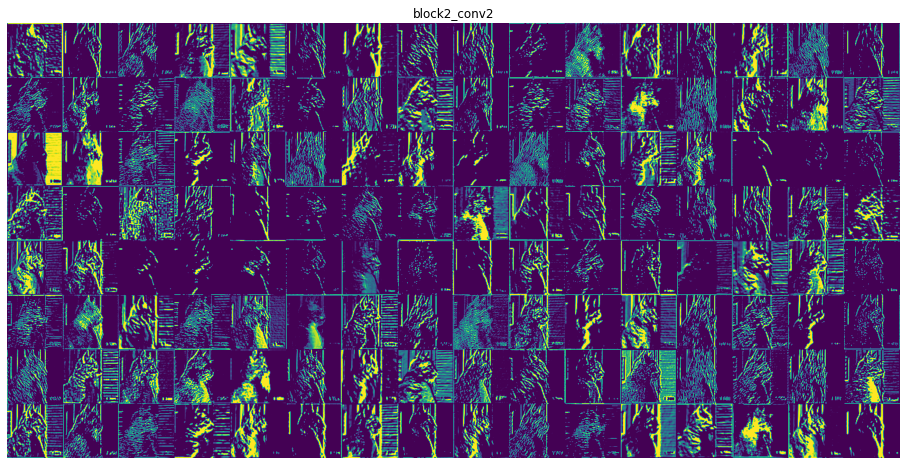

...

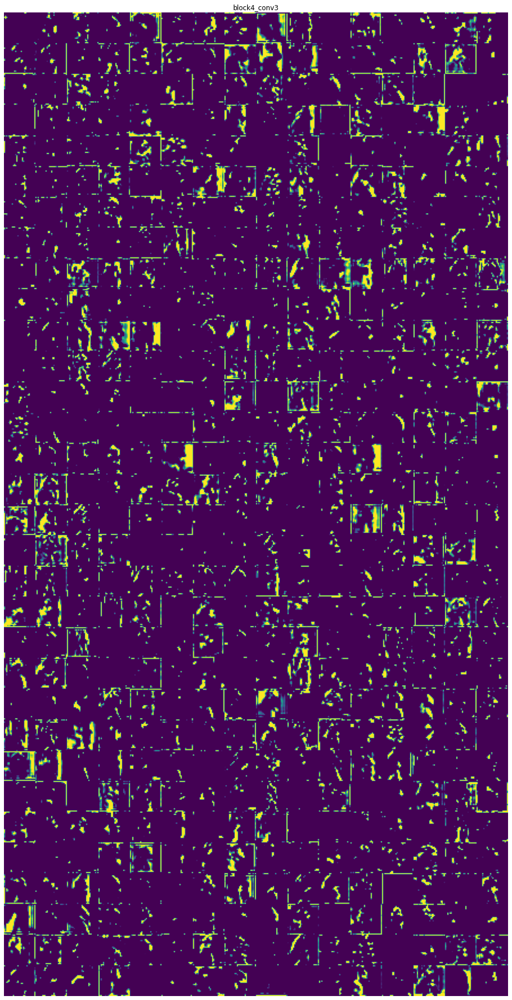

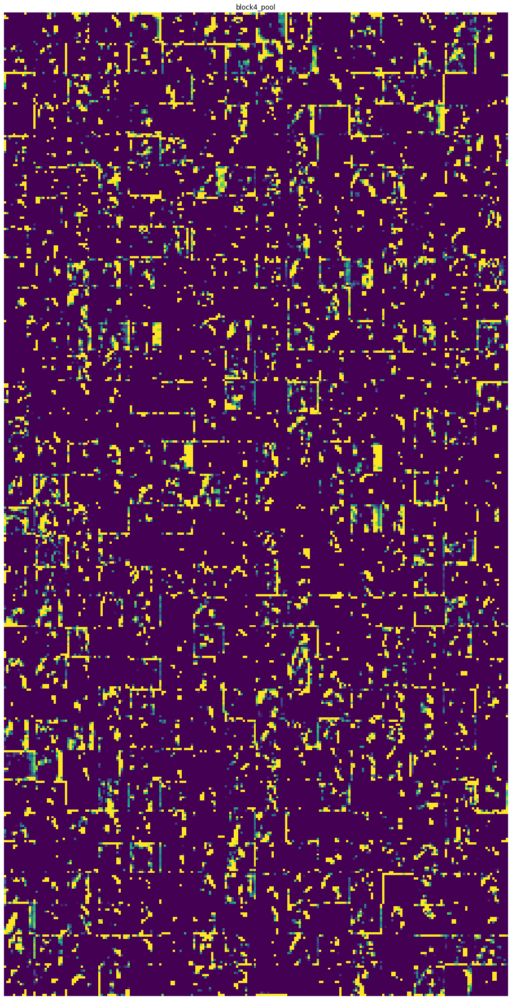

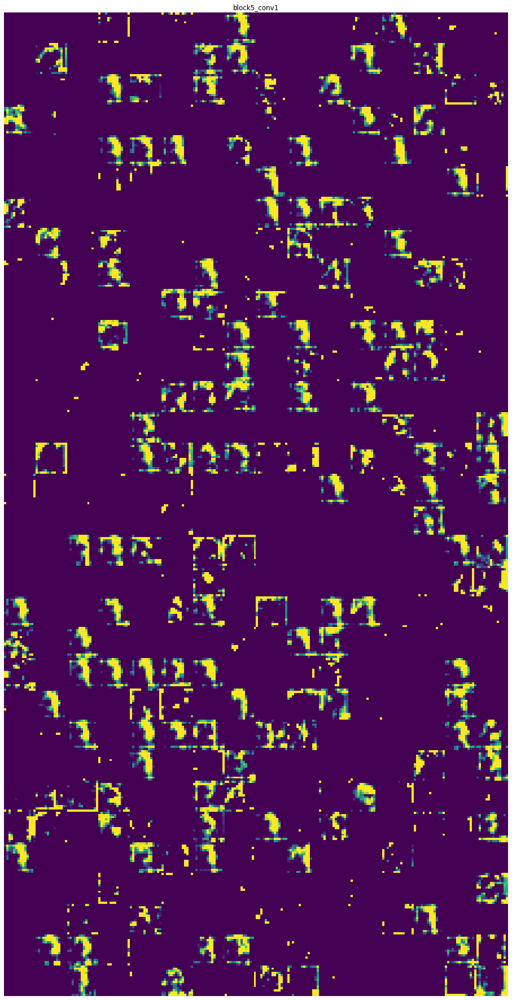

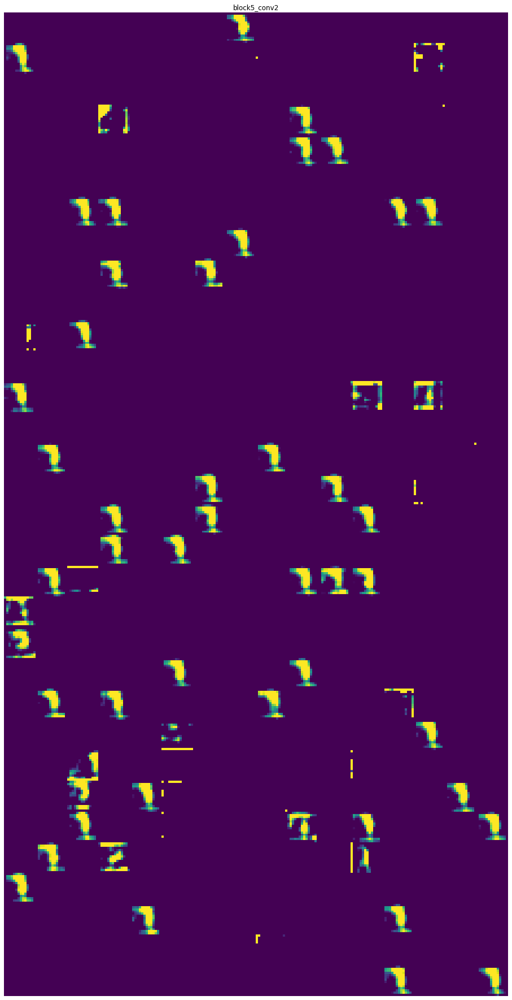

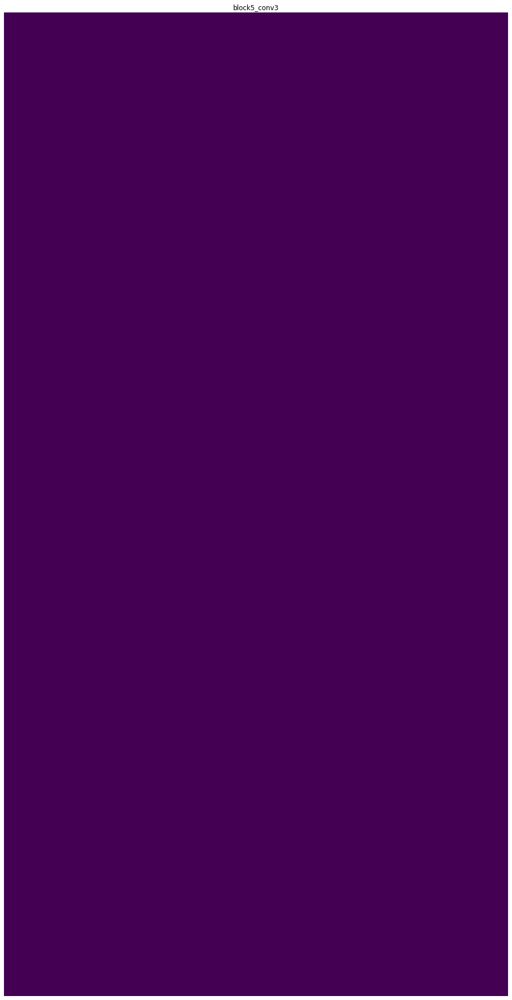

In [12]:
visualize_intermediate_activations(activations=activations, 
                                   layer_names=layer_names)

We can see that there are very few active features and these are mostly located in the face of the cat. This is the region of the image that your model looks at when determining the class.